# 1. Эксперимент #

Цель работы - освоение деревьев решений

## Блок нейтронной физики ##

In [1]:
import pandas as pd
import random as rd
import math as math
import scipy.constants as const # Модуль физико-математических констант

# отключим предупреждения Anaconda
import warnings
warnings.simplefilter('ignore')

N_A = const.Avogadro

### Функция жизни нейтрона: ###

In [2]:
# Для одинаковой генерации данных
rd.seed(42)

def life_of_neutron(Ein, Eout, dens, A1, A2, Mol_m, Sigma, alpha_1, alpha_2, sigma_1, sigma_2, x1, x2):
    
    Energy = Ein
    colision = 0 # Число столкновений
    time = 0 # Время полета
    a = 0 # Угол полета
    b = 0 # Изменение угла полета
    l = 0 # Длина пролета
    V = 0 # Скорость
    elder = 0 #Возраст
    while Energy > Eout: #Пока энергия нейтрона лежит в области > ... ЭВ
        l = -1*math.log(rd.random())/Sigma/100 # В метрах
        V = (2*Energy*1.6*(10**(-19))/(1.6749*10**(-27)))**0.5 # В м/с
        time += l/V
        colision += 1
        
        #Разыгрывание на каком ядре произошло рассеяние
        x = rd.random()
        if x < (x1*sigma_1/(x1*sigma_1 + x2*sigma_2)):# Рассеяние на первом ядре
            E1 = Energy
            E2 = Energy*alpha_1
            Energy = rd.uniform(E1, E2)
            b = math.acos

            
        else:# Рассеяние на втором ядре
            E1 = Energy
            E2 = Energy*alpha_2
            Energy = rd.uniform(E1, E2)

    return colision, time

### Входные данные по материалам: ###

In [3]:
df = pd.DataFrame({'Material': ['Water', 'Heavy Plexiglass', 'Heavy Water'],
                   'Density g/cm^3': [1.0, 1.6, 1.1],
                    'A_1' : [1, 12, 2],
                    'A_2' : [16, 2, 16],
                    'Molar mass g/mol' : [18, 28, 20],
                    'Chemical formula' : ['H2O', 'C2D2', 'D2O'],
                    'sigma_1 b' : [30.0, 4.9, 3.5],
                    'sigma_2 b' : [4.0, 3.5, 4.0],
                    'x1' : [2, 2, 2],
                    'x2' : [1, 2, 1],
                    
              })

df

,Material,Density g/cm^3,A_1,A_2,Molar mass g/mol,Chemical formula,sigma_1 b,sigma_2 b,x1,x2
0,Water,1.0,1,16,18,H2O,30.0,4.0,2,1
1,Heavy Plexiglass,1.6,12,2,28,C2D2,4.9,3.5,2,2
2,Heavy Water,1.1,2,16,20,D2O,3.5,4.0,2,1


### Расчет макросечения: ###

In [4]:
df['\u03A3, 1/cm'] = 0.0
for k in df.index:
    df['Σ, 1/cm'][k] = (df['x1'][k]*df['sigma_1 b'][k]+df['x2'][k]*df['sigma_2 b'][k]
                       )*N_A*df['Density g/cm^3'][k]/df['Molar mass g/mol'][k]/10**(24)
display(df)

,Material,Density g/cm^3,A_1,A_2,Molar mass g/mol,Chemical formula,sigma_1 b,sigma_2 b,x1,x2,"Σ, 1/cm"
0,Water,1.0,1,16,18,H2O,30.0,4.0,2,1,2.141206
1,Heavy Plexiglass,1.6,12,2,28,C2D2,4.9,3.5,2,2,0.578126
2,Heavy Water,1.1,2,16,20,D2O,3.5,4.0,2,1,0.364340


### Расчет ступеньки замедления: ###

In [5]:
df['\u0251_1'] = 0.0
df['\u0251_2'] = 0.0
for k in df.index:
    df['\u0251_1'][k] = ((df['A_1'][k]-1)/(df['A_1'][k]+1))**2
    df['\u0251_2'][k] = ((df['A_2'][k]-1)/(df['A_2'][k]+1))**2
display(df)

,Material,Density g/cm^3,A_1,A_2,Molar mass g/mol,Chemical formula,sigma_1 b,sigma_2 b,x1,x2,"Σ, 1/cm",ɑ_1,ɑ_2
0,Water,1.0,1,16,18,H2O,30.0,4.0,2,1,2.141206,0.000000,0.778547
1,Heavy Plexiglass,1.6,12,2,28,C2D2,4.9,3.5,2,2,0.578126,0.715976,0.111111
2,Heavy Water,1.1,2,16,20,D2O,3.5,4.0,2,1,0.364340,0.111111,0.778547


### Создание DataFrame для записи данных ###

In [6]:
df1 = pd.DataFrame({'time, 10^(-5) c': [],
                   'colisions': [],
                    'Material' : [],
                    'target' : [] 
              })
df1

,"time, 10^(-5) c",colisions,Material,target


### Эксперимент методом Монте-Карло ###

In [7]:
Estart = 1_000_000 #1Мэв
Eend = 1 #1 Эв
Colision = [0, 0, 0, 0]
Time = [0, 0, 0, 0]
number_of_event = 300
counter = 0 # Счетчик для записи в DataFrame
for k in df.index: #Цикл по материалам
    for i in range(0, number_of_event*(k+1)): #Колличество событий для каждого материала
        colision, time = life_of_neutron(Estart, Eend, df['Density g/cm^3'][k],
                                          df['A_1'][k], df['A_2'][k],
                                          df['Molar mass g/mol'][k], df['Σ, 1/cm'][k],
                                          df['ɑ_1'][k], df['ɑ_2'][k],
                                          df['sigma_1 b'][k], df['sigma_2 b'][k],
                                          df['x1'][k], df['x2'][k],)
        df1.loc[counter] = {'Material': df['Material'][k], 'time, 10^(-5) c': time*100_000, 'colisions': colision, 'target': k}
        Colision[k]+=colision
        Time[k]+=time
        counter+=1


for k in df.index:
    Colision[k] = Colision[k]/number_of_event/(k+1)
    Time[k] = Time[k]/number_of_event/(k+1)
    
for k in df.index:
    print(df['Material'][k])
    print(Colision[k])
    print(Time[k])

Water
15.643333333333333
6.787573276044247e-07
Heavy Plexiglass
35.90833333333333
6.268212392367504e-06
Heavy Water
28.513333333333335
7.811704616661977e-06


# 2. Первичный анализ данных с помощью Pandas #

Посмотрим, что представляют собой полученные данные

In [8]:
df1.head()

,"time, 10^(-5) c",colisions,Material,target
0,0.060134,18.0,Water,0.0
1,0.015265,11.0,Water,0.0
2,0.058799,17.0,Water,0.0
3,0.047027,14.0,Water,0.0
4,0.018141,10.0,Water,0.0


Сколько строк и столбцов

In [9]:
df1.shape

(1800, 4)

Общая информация

In [10]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1800 entries, 0 to 1799
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   time, 10^(-5) c  1800 non-null   float64
 1   colisions        1800 non-null   float64
 2   Material         1800 non-null   object 
 3   target           1800 non-null   float64
dtypes: float64(3), object(1)
memory usage: 70.3+ KB


In [11]:
df1['colisions'] = df1['colisions'].astype('int64')
df1['target'] = df1['target'].astype('int64')
df1['time, 10^(-5) c'] = df1['time, 10^(-5) c'].astype('float64')

df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1800 entries, 0 to 1799
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   time, 10^(-5) c  1800 non-null   float64
 1   colisions        1800 non-null   int64  
 2   Material         1800 non-null   object 
 3   target           1800 non-null   int64  
dtypes: float64(1), int64(2), object(1)
memory usage: 70.3+ KB


Распределение числовых параметров

In [12]:
df1.describe()

,"time, 10^(-5) c",colisions,target
count,1800.000000,1800.000000,1800.000000
mean,0.610838,28.833333,1.333333
std,0.430306,9.030121,0.745563
min,0.005600,6.000000,0.000000
25%,0.297471,23.000000,1.000000
50%,0.555621,29.000000,1.500000
75%,0.853301,35.000000,2.000000
max,4.030266,59.000000,2.000000


Изменение типа данных с учетом значений

In [13]:
df1['colisions'] = df1['colisions'].astype('int8')
df1['target'] = df1['target'].astype('int8')
df1['time, 10^(-5) c'] = df1['time, 10^(-5) c'].astype('float64')

df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1800 entries, 0 to 1799
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   time, 10^(-5) c  1800 non-null   float64
 1   colisions        1800 non-null   int8   
 2   Material         1800 non-null   object 
 3   target           1800 non-null   int8   
dtypes: float64(1), int8(2), object(1)
memory usage: 45.7+ KB


Описание не числовых типов данных

In [14]:
df1.describe(include=['object'])

,Material
count,1800
unique,3
top,Heavy Water
freq,900


Распределение данных по целевой переменной

In [15]:
df1['target'].value_counts()

2    900
1    600
0    300
Name: target, dtype: int64

In [16]:
df1['target'].value_counts(normalize=True)

2    0.500000
1    0.333333
0    0.166667
Name: target, dtype: float64

Сортировка по убыванию colisions

In [17]:
df1 = df1.sort_values(by='colisions', ascending=False)
df1.head()

,"time, 10^(-5) c",colisions,Material,target
791,0.729316,59,Heavy Plexiglass,1
680,1.211173,58,Heavy Plexiglass,1
486,2.111941,57,Heavy Plexiglass,1
377,1.457662,56,Heavy Plexiglass,1
807,0.532553,55,Heavy Plexiglass,1


Сортировка по убыванию time, 10^(-5) c

In [18]:
df1 = df1.sort_values(by='time, 10^(-5) c', ascending=False)
df1.head()

,"time, 10^(-5) c",colisions,Material,target
1762,4.030266,40,Heavy Water,2
1246,2.830374,37,Heavy Water,2
1267,2.784204,31,Heavy Water,2
907,2.492663,42,Heavy Water,2
1013,2.417235,29,Heavy Water,2


Сортировка по возрастанию colisions

In [19]:
df1 = df1.sort_values(by='colisions', ascending=True)
df1.head()

,"time, 10^(-5) c",colisions,Material,target
280,0.013819,6,Water,0
129,0.039810,6,Water,0
178,0.019329,7,Water,0
61,0.017364,7,Water,0
44,0.017380,7,Water,0


In [20]:
import numpy as np

Максимум по каждому признаку

In [21]:
df1.apply(np.max)

time, 10^(-5) c    4.03027
colisions               59
Material             Water
target                   2
dtype: object

Группировка данных

In [22]:
columns_to_show = ['time, 10^(-5) c', 'colisions']
df1.groupby(['target'])[columns_to_show].describe(percentiles=[0.25, 0.50, 0.99])

time, 10^(-5) c                                                    \
                 count      mean       std       min       25%       50%   
target                                                                     
0                300.0  0.067876  0.052758  0.005600  0.031281  0.053436   
1                600.0  0.626821  0.300871  0.122030  0.386285  0.576300   
2                900.0  0.781170  0.426260  0.047984  0.472239  0.689330   

                           colisions                                         \
             99%       max     count       mean       std   min   25%   50%   
target                                                                        
0       0.236044  0.388820     300.0  15.643333  3.967610   6.0  13.0  16.0   
1       1.390077  2.111941     600.0  35.908333  7.160217  16.0  31.0  35.0   
2       1.994400  4.030266     900.0  28.513333  5.675782  15.0  24.0  28.0   

                     
          99%   max  
target               
0       26.00  27.0  
1       54.01  59.0  
2       42.00  48.0

In [23]:
df1.groupby(['target'])[columns_to_show].agg([np.mean, np.std, np.min, np.max])

time, 10^(-5) c                                colisions            \
                  mean       std      amin      amax       mean       std   
target                                                                      
0             0.067876  0.052758  0.005600  0.388820  15.643333  3.967610   
1             0.626821  0.300871  0.122030  2.111941  35.908333  7.160217   
2             0.781170  0.426260  0.047984  4.030266  28.513333  5.675782   

                  
       amin amax  
target            
0         6   27  
1        16   59  
2        15   48

Cредние значения по признакам в зависимости от target

In [24]:
df1.pivot_table(['colisions', 'time, 10^(-5) c'], ['target'], aggfunc='mean').head(10)

,colisions,"time, 10^(-5) c"
target,,
0,15.643333,0.067876
1,35.908333,0.626821
2,28.513333,0.781170


# 3. Визуализация экспериментальных данных  #

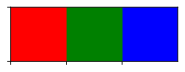

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt
#графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg'

import matplotlib as mpl
mpl.rcParams["xtick.bottom"] = True

flatui = ["red", "green", "blue"]
sns.palplot(sns.color_palette(flatui))

sns.set(font_scale = 1.5,
       style='white',
       palette=flatui,
       )

sns.set_style("ticks", {"xtick.bottom": True})

Распределение столкновений

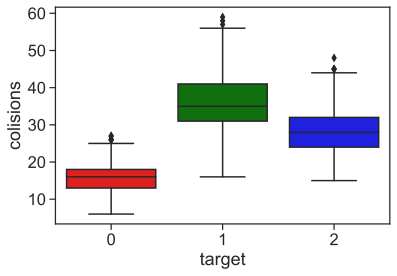

In [26]:
sns.boxplot(y="colisions", x="target",
            data=df1)

Распределение времени

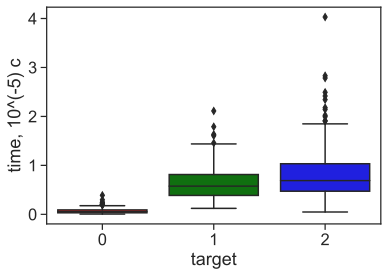

In [27]:
sns.boxplot(y="time, 10^(-5) c", x="target",
            data=df1)

Карта распрделений

In [28]:
df1['colisions'] = df1['colisions']/100
df1.rename(columns={'colisions': 'colisions, 10^2'}, inplace=True)

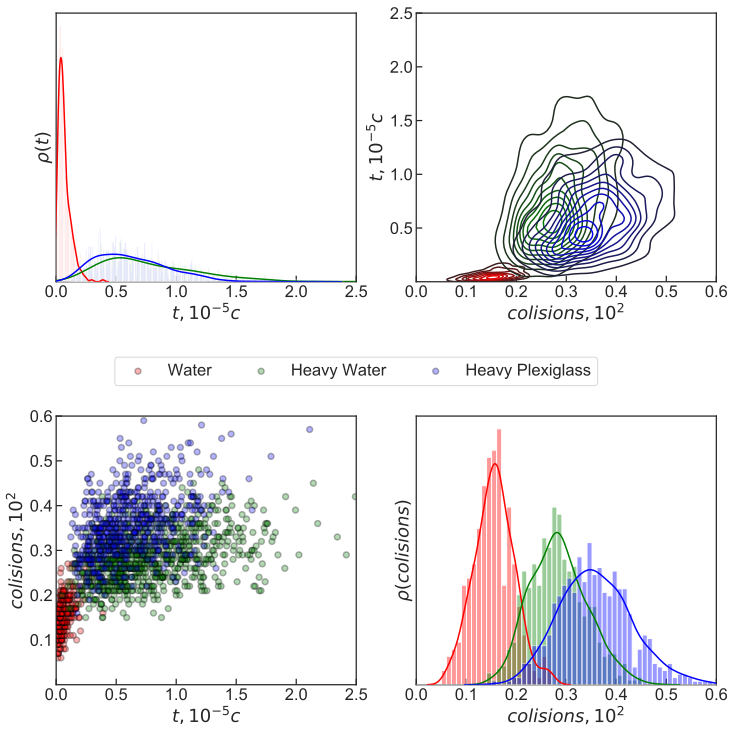

In [29]:
sns.set(font_scale = 1.5,
       style='white',
       )

g = sns.PairGrid(df1[['time, 10^(-5) c','colisions, 10^2', 'Material']],
                 hue='Material',
                 height=5.5,
                 palette= flatui,
                 despine = False,
                 hue_kws={
                     "marker": ["o", "o", "o"]
                 })

g.map_diag(sns.distplot, norm_hist = True, bins = np.linspace(0.0, 2.4, num=(6*4*10), endpoint=True))
g.map_upper(sns.kdeplot, shade=False, shade_lowest=False)
g.map_lower(plt.scatter, s = 35, alpha=0.3, linewidth=1.5, edgecolor="black")
g.fig.set_size_inches(10, 10)


plt.legend(loc='upper center', bbox_to_anchor=(1, 1.25), ncol=3) #vertical legend

# Подписи к осям
g.axes[0,0].yaxis.set_label_text(r'$\rho (t) $')
g.axes[0,0].xaxis.set_label_text('$t, 10^{-5} c$')
g.axes[1,1].yaxis.set_label_text(r'$\rho (colisions) $')
g.axes[1,1].xaxis.set_label_text('$colisions, 10^{2}$')
g.axes[1,0].yaxis.set_label_text('$colisions, 10^{2}$')
g.axes[1,0].xaxis.set_label_text('$t, 10^{-5} c$')
g.axes[0,1].yaxis.set_label_text('$t, 10^{-5} c$')
g.axes[0,1].xaxis.set_label_text('$colisions, 10^{2}$')

# Тики видны на y
g.axes[0,0].yaxis.set_tick_params(labelleft=False)
g.axes[1,1].yaxis.set_tick_params(labelleft=False)
g.axes[1,0].yaxis.set_tick_params(labelleft=True, bottom = True, direction = 'in')
g.axes[0,1].yaxis.set_tick_params(labelleft=True, bottom = True, direction = 'in')

# Тики видны на x
g.axes[0,0].xaxis.set_tick_params(labelleft=True, bottom = True, direction = 'in')
g.axes[1,1].xaxis.set_tick_params(labelleft=True, bottom = True, direction = 'in')
g.axes[1,0].xaxis.set_tick_params(labelleft=True, bottom = True, direction = 'in')
g.axes[0,1].xaxis.set_tick_params(labelleft=True, bottom = True, direction = 'in')

#Лимиты тиков на x
g.axes[1,0].set_xlim(0, 2.5)
g.axes[0,1].set_xlim(0, 0.6)

#Лимиты тиков на y
g.axes[1,0].set_ylim(0.00001, 0.6)
g.axes[0,0].set_ylim(0.00001, 2.5)

plt.subplots_adjust(hspace=0.5, wspace=0.2)

# 4. Классификация ML #

<img src="Ensemble.PNG">

## 4.1 Подготовка тренировочной и тестовой выборок ##

In [30]:
from sklearn import model_selection
from sklearn import metrics
from sklearn import linear_model

In [31]:
train_data, test_data, train_labels, test_labels = model_selection.train_test_split(
    df1[['time, 10^(-5) c', 'colisions, 10^2']], df1[['target']],
    test_size = 0.3, random_state = 0)

Посмотрим что из себя представляет тестовая выборка

In [32]:
train_data

,"time, 10^(-5) c","colisions, 10^2"
1322,1.115591,0.36
665,0.355155,0.34
1036,1.014331,0.24
448,1.039403,0.41
1173,0.753849,0.36
...,...,...
1508,0.392397,0.28
1251,1.355760,0.33
307,0.426035,0.41
1774,1.389666,0.25


Сравним тестовую и обучающую выборки с исходным набором данных

In [33]:
display(df1.describe())
display(test_data.describe())
display(train_data.describe())

,"time, 10^(-5) c","colisions, 10^2",target
count,1800.000000,1800.000000,1800.000000
mean,0.610838,0.288333,1.333333
std,0.430306,0.090301,0.745563
min,0.005600,0.060000,0.000000
25%,0.297471,0.230000,1.000000
50%,0.555621,0.290000,1.500000
75%,0.853301,0.350000,2.000000
max,4.030266,0.590000,2.000000


,"time, 10^(-5) c","colisions, 10^2"
count,540.000000,540.000000
mean,0.588317,0.282926
std,0.407748,0.091097
min,0.005684,0.060000
25%,0.288450,0.227500
50%,0.541721,0.285000
75%,0.834502,0.340000
max,2.784204,0.590000


,"time, 10^(-5) c","colisions, 10^2"
count,1260.000000,1260.000000
mean,0.620490,0.290651
std,0.439424,0.089895
min,0.005600,0.060000
25%,0.302516,0.230000
50%,0.562695,0.290000
75%,0.859373,0.350000
max,4.030266,0.580000


Сравним частоту попадания каждого класса в исходном наборе, тестовой и тренировочной выборках

In [34]:
display(df1['target'].value_counts(normalize=True))
display(test_labels['target'].value_counts(normalize=True))
display(train_labels['target'].value_counts(normalize=True))

2    0.500000
1    0.333333
0    0.166667
Name: target, dtype: float64

2    0.507407
1    0.318519
0    0.174074
Name: target, dtype: float64

2    0.496825
1    0.339683
0    0.163492
Name: target, dtype: float64

## 4.2 Метрики точности ##

Precision (точность) можно интерпретировать как долю объектов, названных классификатором положительными и при этом действительно являющимися положительными (Реально Water из всех определенных Water):

\begin{align*} precision = {\frac{TP}{TP+FP}} \end{align*}

Recall (полнота) показывает, какую долю объектов положительного класса из всех объектов положительного класса нашел алгоритм (Сколько Water определено как Water):

\begin{align*} recall = {\frac{TP}{TP+FN}} \end{align*}

## 4.3 Алгоритм Дерево решений ##

Энтропия Шенона для системы с N возможными состояниями:

\begin{align*}
\Large S = -\sum_{i=1}^{N}p_i \log_2{p_i}
\end{align*}

Прирост информации при разбиении выборки по признаку Q определяется как:

\begin{align*}
\Large IG(Q) = S_O - \sum_{i=1}^{q}\frac{N_i}{N}S_i,
\end{align*}

где  q – число групп после разбиения, Ni  – число элементов выборки, у которых признак Q имеет i-ое значение.

Неопределенность Джини:

\begin{align*}
\Large G = 1 - \sum\limits_k (p_k)^2
\end{align*}


Максимизацию этого критерия можно интерпретировать как максимизацию числа пар объектов одного класса, оказавшихся в одном поддереве. $ p_k $ - доля объектов класса k, попавших в вершину.

Тренировка модели

In [35]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text
decision_tree = DecisionTreeClassifier(random_state=0, max_depth=2, criterion = 'gini')
decision_tree = decision_tree.fit(train_data, train_labels)

Текстовая визуализация алгоритма

In [36]:
r = export_text(decision_tree, feature_names=list(train_data))
print(r)

|--- time, 10^(-5) c <= 0.17
|   |--- colisions, 10^2 <= 0.28
|   |   |--- class: 0
|   |--- colisions, 10^2 >  0.28
|   |   |--- class: 1
|--- time, 10^(-5) c >  0.17
|   |--- colisions, 10^2 <= 0.33
|   |   |--- class: 2
|   |--- colisions, 10^2 >  0.33
|   |   |--- class: 1



Сброс настроек matplotlib к начальным

In [37]:
import matplotlib.style
import matplotlib as mpl
mpl.style.use('seaborn-dark')

Визуализация дерева решений

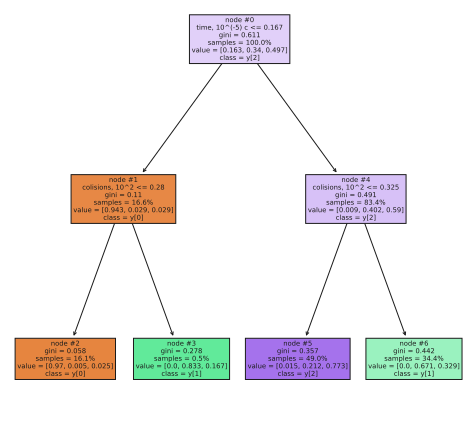

In [38]:
import matplotlib.pyplot as plt

from sklearn.tree import plot_tree

mpl.style.use('classic')
mpl.rcParams['figure.facecolor'] = 'white'

plt.figure(figsize=(7.5,7.5), dpi=80)

plot_tree(decision_tree,
          class_names  = True,
          label = 'all',
          filled=True,
          node_ids = True,
          proportion = True,
          feature_names=list(train_data))
plt.show()

In [39]:
display(train_data.head(2))
display(test_data.head(2))
display(train_labels.head(2))
display(test_labels.head(2))

,"time, 10^(-5) c","colisions, 10^2"
1322,1.115591,0.36
665,0.355155,0.34


,"time, 10^(-5) c","colisions, 10^2"
1749,0.843979,0.25
1048,0.752267,0.28


,target
1322,2
665,1


,target
1749,2
1048,2


## Метрики точности задачи классификации ##

In [40]:
model_predictions = decision_tree.predict(test_data)
print(metrics.accuracy_score(test_labels, model_predictions))
print(metrics.classification_report(test_labels, model_predictions))

0.7444444444444445
              precision    recall  f1-score   support

           0       0.93      0.95      0.94        94
           1       0.63      0.63      0.63       172
           2       0.75      0.74      0.75       274

    accuracy                           0.74       540
   macro avg       0.77      0.78      0.77       540
weighted avg       0.74      0.74      0.74       540



## 4.4 Визуализация предсказаний ##

In [41]:
mpl.style.use('classic')

font = {'family': 'serif',
        'color':  'black',
        'weight': 'normal',
        'size': 12,
        }

mpl.rcParams["xtick.top"] = False
mpl.rcParams["ytick.right"] = False
mpl.rcParams['figure.facecolor'] = 'white'

from matplotlib.colors import ListedColormap
colors = ListedColormap(['red', 'green','blue'])

Подготовка данных для отображения ошибок в определении класса

In [42]:
error = [] # 1, если ошибка, 0 если правильно
np_test_labels = test_labels['target'].to_numpy()
for i in range(len(np_test_labels)):
    if np_test_labels[i] == model_predictions[i]:
        error.append(1)
    else:
        error.append(0)

error = np.array(error)

Подготовка данных для построения диаграммы рассеяния тестовой выборки и предсказаний модели

In [43]:
test_data

,"time, 10^(-5) c","colisions, 10^2"
1749,0.843979,0.25
1048,0.752267,0.28
794,0.554703,0.32
1443,0.456736,0.23
477,0.683648,0.44
...,...,...
1615,0.838208,0.25
864,0.310861,0.21
175,0.018462,0.11
1284,2.142416,0.45


In [44]:
test_labels

,target
1749,2
1048,2
794,1
1443,2
477,1
...,...
1615,2
864,1
175,0
1284,2


In [45]:
new_df = test_data
new_df

,"time, 10^(-5) c","colisions, 10^2"
1749,0.843979,0.25
1048,0.752267,0.28
794,0.554703,0.32
1443,0.456736,0.23
477,0.683648,0.44
...,...,...
1615,0.838208,0.25
864,0.310861,0.21
175,0.018462,0.11
1284,2.142416,0.45


In [46]:
new_df['target'] = test_labels
new_df

,"time, 10^(-5) c","colisions, 10^2",target
1749,0.843979,0.25,2
1048,0.752267,0.28,2
794,0.554703,0.32,1
1443,0.456736,0.23,2
477,0.683648,0.44,1
...,...,...,...
1615,0.838208,0.25,2
864,0.310861,0.21,1
175,0.018462,0.11,0
1284,2.142416,0.45,2


In [47]:
new_df_0 = new_df
new_df_1 = new_df
new_df_2 = new_df

In [48]:
new_df_0 = new_df_0.drop(new_df_0[new_df_0.target != 0].index)
new_df_1 = new_df_1.drop(new_df_1[new_df_1.target != 1].index)
new_df_2 = new_df_2.drop(new_df_2[new_df_2.target != 2].index)
display(new_df.head(5))
display(new_df_0.head(5))
display(new_df_1.head(5))
display(new_df_2.head(5))

,"time, 10^(-5) c","colisions, 10^2",target
1749,0.843979,0.25,2
1048,0.752267,0.28,2
794,0.554703,0.32,1
1443,0.456736,0.23,2
477,0.683648,0.44,1


,"time, 10^(-5) c","colisions, 10^2",target
69,0.044142,0.16,0
216,0.037782,0.08,0
19,0.098768,0.13,0
182,0.005684,0.10,0
134,0.122004,0.17,0


,"time, 10^(-5) c","colisions, 10^2",target
794,0.554703,0.32,1
477,0.683648,0.44,1
835,0.374958,0.32,1
533,0.673747,0.43,1
603,0.894554,0.45,1


,"time, 10^(-5) c","colisions, 10^2",target
1749,0.843979,0.25,2
1048,0.752267,0.28,2
1443,0.456736,0.23,2
1501,0.722579,0.29,2
1401,0.375421,0.26,2


In [49]:
new_df_0['target'].value_counts()

0    94
Name: target, dtype: int64

In [50]:
new_df_1['target'].value_counts()

1    172
Name: target, dtype: int64

In [51]:
new_df_2['target'].value_counts()

2    274
Name: target, dtype: int64

In [52]:
new_df['target'].value_counts()

2    274
1    172
0     94
Name: target, dtype: int64

In [53]:
error = [] # 1, если ошибка, 0 если правильно
time = []
colisions = []

np_test_labels = test_labels['target'].to_numpy()
np_test_time = test_data['time, 10^(-5) c'].to_numpy()
np_test_colisions = test_data['colisions, 10^2'].to_numpy()

for i in range(len(np_test_labels)):
    if np_test_labels[i] == model_predictions[i]:
        error.append(0)
    else:
        error.append(1)
        
for i in range(len(error)):
    if error[i] == 1:
        time.append(np_test_time[i])
        colisions.append(np_test_colisions[i])   

In [54]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(12,16))

#  Заголовок области Figure:
fig.suptitle('Дерево решений, глубина 2',
             y= 0.95,
             fontsize = 20)

plt.subplots_adjust(wspace=0.15, hspace=0.2)

ax_1 = fig.add_subplot(3, 2, 1)
ax_2 = fig.add_subplot(3, 2, 4)
ax_3 = fig.add_subplot(3, 2, 3)
ax_4 = fig.add_subplot(3, 2, 2)

ax_1.set_xlim(0, 3)
ax_1.set_ylim(0, 0.7)
ax_2.set_xlim(0, 3)
ax_2.set_ylim(0, 0.7)
ax_3.set_xlim(0, 3)
ax_3.set_ylim(0, 0.7)
ax_4.set_xlim(0, 3)
ax_4.set_ylim(0, 0.7)

ax_1.set(title = 'Разделяющая поверхность')
def get_grid():
    x_min, x_max = 0, 4
    y_min, y_max = 0, 1
    return np.meshgrid(np.arange(x_min, x_max, 0.025),
                         np.arange(y_min, y_max, 0.025))
xx, yy = get_grid()
predicted = decision_tree.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
ax_1.pcolormesh(xx, yy, predicted, cmap=colors)
ax_1.scatter(test_data['time, 10^(-5) c'], test_data['colisions, 10^2'], c=test_labels['target'], s=15,
             cmap=colors, edgecolors='black', linewidth=1.5)
ax_1.set_ylabel('colisions, 10^2')
ax_1.set_xlabel('time, 10^(-5) c')


ax_2.set(title = 'Тестовый набор')
ax_2.scatter(new_df_0['time, 10^(-5) c'], new_df_0['colisions, 10^2'], c='red',
               s = 15, edgecolors = 'black', linewidths = 1, alpha = 0.5, label = 'Water')
ax_2.scatter(new_df_1['time, 10^(-5) c'], new_df_1['colisions, 10^2'], c='green',
               s = 15, edgecolors = 'black', linewidths = 1, alpha = 0.5, label = 'Heavy Plexiglass')
ax_2.scatter(new_df_2['time, 10^(-5) c'], new_df_2['colisions, 10^2'], c='blue',
               s = 15, edgecolors = 'black', linewidths = 1, alpha = 0.5, label = 'Heavy Water')
ax_2.set_ylabel('colisions, 10^2')
ax_2.set_xlabel('time, 10^(-5) c')
ax_2.set_title('Тестовый набор')
ax_2.set_xlim(left = 0)
ax_2.legend()

ax_3.set(title = 'Модель')
ax_3.scatter(test_data['time, 10^(-5) c'], test_data['colisions, 10^2'], c=model_predictions, cmap=colors, s = 15
            , edgecolors = 'black', linewidths = 1, alpha = 0.5)
ax_3.set_ylabel('colisions, 10^2')
ax_3.set_xlabel('time, 10^(-5) c')
ax_3.set_title('Модель')
ax_3.set_xlim(left = 0)

ax_4.set(title = 'Ошибки')
ax_4.pcolormesh(xx, yy, predicted, cmap=colors)
ax_4.scatter(time, colisions, c='yellow',
               s = 15, edgecolors = 'black', linewidths = 1, alpha = 0.5)
ax_4.set_ylabel('colisions, 10^2')
ax_4.set_xlabel('time, 10^(-5) c')
ax_4.set_title('Ошибки')
ax_4.set_xlim(left = 0)
ax_4.set_xlim(right = 3)
ax_4.set_ylim(bottom = 0)
ax_4.set_ylim(top = 0.7)
#fig.savefig('мой график1')
plt.show()

print(metrics.classification_report(test_labels, model_predictions))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94        94
           1       0.63      0.63      0.63       172
           2       0.75      0.74      0.75       274

    accuracy                           0.74       540
   macro avg       0.77      0.78      0.77       540
weighted avg       0.74      0.74      0.74       540



## 4.5 Бэгинг решающих деревьев и случайный лес ##

Основное различие случайного леса и бэггинга на деревьях решений заключается в том, что в случайном лесе выбирается случайное подмножество признаков, и лучший признак для разделения узла определяется из подвыборки признаков, в отличие от бэггинга, где все функции рассматриваются для разделения в узле.

In [55]:
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_circles
from sklearn import model_selection
import numpy as np
from matplotlib import pyplot as plt

In [56]:
display(train_data.head(2))
display(test_data.head(2))
display(train_labels.head(2))
display(test_labels.head(2))

,"time, 10^(-5) c","colisions, 10^2"
1322,1.115591,0.36
665,0.355155,0.34


,"time, 10^(-5) c","colisions, 10^2",target
1749,0.843979,0.25,2
1048,0.752267,0.28,2


,target
1322,2
665,1


,target
1749,2
1048,2


In [57]:
b_dtree = BaggingClassifier(DecisionTreeClassifier(min_samples_split=40),n_estimators=300, random_state=42)
b_dtree.fit(train_data, train_labels)

BaggingClassifier(base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                        class_weight=None,
                                                        criterion='gini',
                                                        max_depth=None,
                                                        max_features=None,
                                                        max_leaf_nodes=None,
                                                        min_impurity_decrease=0.0,
                                                        min_impurity_split=None,
                                                        min_samples_leaf=1,
                                                        min_samples_split=40,
                                                        min_weight_fraction_leaf=0.0,
                                                        presort='deprecated',
                                                        random_state=None,

In [58]:
model_predictions_b_dtree = b_dtree.predict(test_data[["time, 10^(-5) c", "colisions, 10^2"]])
print(metrics.accuracy_score(test_labels, model_predictions_b_dtree))
print(metrics.classification_report(test_labels, model_predictions_b_dtree))

0.7870370370370371
              precision    recall  f1-score   support

           0       0.95      0.95      0.95        94
           1       0.70      0.66      0.68       172
           2       0.78      0.81      0.80       274

    accuracy                           0.79       540
   macro avg       0.81      0.81      0.81       540
weighted avg       0.79      0.79      0.79       540



In [59]:
error = [] # 1, если ошибка, 0 если правильно
time = []
colisions = []

np_test_labels = test_labels['target'].to_numpy()
np_test_time = test_data['time, 10^(-5) c'].to_numpy()
np_test_colisions = test_data['colisions, 10^2'].to_numpy()

for i in range(len(np_test_labels)):
    if np_test_labels[i] == model_predictions_b_dtree[i]:
        error.append(0)
    else:
        error.append(1)
        
for i in range(len(error)):
    if error[i] == 1:
        time.append(np_test_time[i])
        colisions.append(np_test_colisions[i])   

In [65]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(12,16))

#  Заголовок области Figure:
fig.suptitle('бэггинг (Бутстрэп-агрегирование)',
             y= 0.95,
             fontsize = 20)

plt.subplots_adjust(wspace=0.15, hspace=0.2)

ax_1 = fig.add_subplot(3, 2, 1)
ax_2 = fig.add_subplot(3, 2, 4)
ax_3 = fig.add_subplot(3, 2, 3)
ax_4 = fig.add_subplot(3, 2, 2)

ax_1.set_xlim(0, 3)
ax_1.set_ylim(0, 0.7)
ax_2.set_xlim(0, 3)
ax_2.set_ylim(0, 0.7)
ax_3.set_xlim(0, 3)
ax_3.set_ylim(0, 0.7)
ax_4.set_xlim(0, 3)
ax_4.set_ylim(0, 0.7)

ax_1.set(title = 'Разделяющая поверхность')
def get_grid():
    x_min, x_max = 0, 4
    y_min, y_max = 0, 1
    return np.meshgrid(np.arange(x_min, x_max, 0.025),
                         np.arange(y_min, y_max, 0.025))
xx, yy = get_grid()
predicted = b_dtree.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
ax_1.pcolormesh(xx, yy, predicted, cmap=colors)
ax_1.scatter(test_data['time, 10^(-5) c'], test_data['colisions, 10^2'], c=test_labels['target'], s=15,
             cmap=colors, edgecolors='black', linewidth=1.5)
ax_1.set_ylabel('colisions, 10^2')
ax_1.set_xlabel('time, 10^(-5) c')

ax_2.scatter(new_df_0['time, 10^(-5) c'], new_df_0['colisions, 10^2'], c='red',
               s = 15, edgecolors = 'black', linewidths = 1, alpha = 0.5, label = 'Water')
ax_2.scatter(new_df_1['time, 10^(-5) c'], new_df_1['colisions, 10^2'], c='green',
               s = 15, edgecolors = 'black', linewidths = 1, alpha = 0.5, label = 'Heavy Plexiglass')
ax_2.scatter(new_df_2['time, 10^(-5) c'], new_df_2['colisions, 10^2'], c='blue',
               s = 15, edgecolors = 'black', linewidths = 1, alpha = 0.5, label = 'Heavy Water')
ax_2.set_ylabel('colisions, 10^2')
ax_2.set_xlabel('time, 10^(-5) c')
ax_2.set_title('Тестовый набор')
ax_2.set_xlim(left = 0)
ax_2.legend()

ax_3.set(title = 'Модель')
ax_3.scatter(test_data['time, 10^(-5) c'], test_data['colisions, 10^2'], c=model_predictions_b_dtree, cmap=colors, s = 15
            , edgecolors = 'black', linewidths = 1, alpha = 0.5)
ax_3.set_ylabel('colisions, 10^2')
ax_3.set_xlabel('time, 10^(-5) c')
ax_3.set_title('Модель')
ax_3.set_xlim(left = 0)

ax_4.pcolormesh(xx, yy, predicted, cmap=colors)
ax_4.scatter(time, colisions, c='yellow',
               s = 15, edgecolors = 'black', linewidths = 1, alpha = 0.5)
ax_4.set_ylabel('colisions, 10^2')
ax_4.set_xlabel('time, 10^(-5) c')
ax_4.set_title('Ошибки')
ax_4.set_xlim(left = 0)
ax_4.set_xlim(right = 3)
ax_4.set_ylim(bottom = 0)
ax_4.set_ylim(top = 0.7)
plt.show()

print(metrics.classification_report(test_labels, model_predictions_b_dtree))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95        94
           1       0.70      0.66      0.68       172
           2       0.78      0.81      0.80       274

    accuracy                           0.79       540
   macro avg       0.81      0.81      0.81       540
weighted avg       0.79      0.79      0.79       540



## 4.6 Случайный лес ##

In [61]:
rf = RandomForestClassifier(n_estimators=300, random_state=42, min_samples_split = 30)
rf.fit(train_data, train_labels)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=30,
                       min_weight_fraction_leaf=0.0, n_estimators=300,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [62]:
model_predictions_rf = rf.predict(test_data[["time, 10^(-5) c", "colisions, 10^2"]])
print(metrics.accuracy_score(test_labels, model_predictions_rf))
print(metrics.classification_report(test_labels, model_predictions_rf))

0.7870370370370371
              precision    recall  f1-score   support

           0       0.93      0.95      0.94        94
           1       0.71      0.66      0.69       172
           2       0.78      0.81      0.80       274

    accuracy                           0.79       540
   macro avg       0.81      0.81      0.81       540
weighted avg       0.78      0.79      0.79       540



In [63]:
error = [] # 1, если ошибка, 0 если правильно
time = []
colisions = []

np_test_labels = test_labels['target'].to_numpy()
np_test_time = test_data['time, 10^(-5) c'].to_numpy()
np_test_colisions = test_data['colisions, 10^2'].to_numpy()

for i in range(len(np_test_labels)):
    if np_test_labels[i] == model_predictions_rf[i]:
        error.append(0)
    else:
        error.append(1)
        
for i in range(len(error)):
    if error[i] == 1:
        time.append(np_test_time[i])
        colisions.append(np_test_colisions[i])   

In [64]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(12,16))

#  Заголовок области Figure:
fig.suptitle('Random forest',
             y= 0.95,
             fontsize = 20)

plt.subplots_adjust(wspace=0.15, hspace=0.2)

ax_1 = fig.add_subplot(3, 2, 1)
ax_2 = fig.add_subplot(3, 2, 4)
ax_3 = fig.add_subplot(3, 2, 3)
ax_4 = fig.add_subplot(3, 2, 2)

ax_1.set_xlim(0, 3)
ax_1.set_ylim(0, 0.7)
ax_2.set_xlim(0, 3)
ax_2.set_ylim(0, 0.7)
ax_3.set_xlim(0, 3)
ax_3.set_ylim(0, 0.7)
ax_4.set_xlim(0, 3)
ax_4.set_ylim(0, 0.7)

ax_1.set(title = 'Разделяющая поверхность')
def get_grid():
    x_min, x_max = 0, 4
    y_min, y_max = 0, 1
    return np.meshgrid(np.arange(x_min, x_max, 0.025),
                         np.arange(y_min, y_max, 0.025))
xx, yy = get_grid()
predicted = rf.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
ax_1.pcolormesh(xx, yy, predicted, cmap=colors)
ax_1.scatter(test_data['time, 10^(-5) c'], test_data['colisions, 10^2'], c=test_labels['target'], s=15,
             cmap=colors, edgecolors='black', linewidth=1.5)
ax_1.set_ylabel('colisions, 10^2')
ax_1.set_xlabel('time, 10^(-5) c')

ax_2.scatter(new_df_0['time, 10^(-5) c'], new_df_0['colisions, 10^2'], c='red',
               s = 15, edgecolors = 'black', linewidths = 1, alpha = 0.5, label = 'Water')
ax_2.scatter(new_df_1['time, 10^(-5) c'], new_df_1['colisions, 10^2'], c='green',
               s = 15, edgecolors = 'black', linewidths = 1, alpha = 0.5, label = 'Heavy Plexiglass')
ax_2.scatter(new_df_2['time, 10^(-5) c'], new_df_2['colisions, 10^2'], c='blue',
               s = 15, edgecolors = 'black', linewidths = 1, alpha = 0.5, label = 'Heavy Water')
ax_2.set_ylabel('colisions, 10^2')
ax_2.set_xlabel('time, 10^(-5) c')
ax_2.set_title('Тестовый набор')
ax_2.set_xlim(left = 0)
ax_2.legend()

ax_3.set(title = 'Модель')
ax_3.scatter(test_data['time, 10^(-5) c'], test_data['colisions, 10^2'], c=model_predictions_rf, cmap=colors, s = 15
            , edgecolors = 'black', linewidths = 1, alpha = 0.5)
ax_3.set_ylabel('colisions, 10^2')
ax_3.set_xlabel('time, 10^(-5) c')
ax_3.set_title('Модель')
ax_3.set_xlim(left = 0)

ax_4.pcolormesh(xx, yy, predicted, cmap=colors)
ax_4.scatter(time, colisions, c='yellow',
               s = 15, edgecolors = 'black', linewidths = 1, alpha = 0.5)
ax_4.set_ylabel('colisions, 10^2')
ax_4.set_xlabel('time, 10^(-5) c')
ax_4.set_title('Ошибки')
ax_4.set_xlim(left = 0)
ax_4.set_xlim(right = 3)
ax_4.set_ylim(bottom = 0)
ax_4.set_ylim(top = 0.7)
plt.show()

print(metrics.classification_report(test_labels, model_predictions_rf))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94        94
           1       0.71      0.66      0.69       172
           2       0.78      0.81      0.80       274

    accuracy                           0.79       540
   macro avg       0.81      0.81      0.81       540
weighted avg       0.78      0.79      0.79       540

